In [1]:
import tsunamibayes as tb
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import glob
from gauges import build_gauges
from scipy.stats import gaussian_kde
import cartopy.crs as ccrs

In [2]:
%matplotlib notebook

In [3]:
plt.style.use('seaborn')

In [4]:
def eval_llh(model_output,gauges):
    llh = pd.DataFrame(columns=model_output.columns)
    for gauge in gauges:
        for obstype in gauge.obstypes:
            llh[gauge.name+' '+obstype] = gauge.dists[obstype].logpdf(model_output[gauge.name+' '+obstype])
    return llh

In [5]:
dirs = glob.glob("3*/")
samples = []
model_params = []
model_output = []
bayes_data = []
debug = []
data = (['samples','model_params','model_output','bayes_data','debug'],
             [samples,model_params,model_output,bayes_data,debug])

for dir_ in dirs:
    for kind,lst in zip(*data):
        k=6001
        if kind=='debug':
            k=6000
        df = pd.read_csv(dir_+kind+'.csv',index_col=0).iloc[k:].reset_index(drop=True)
#         df['chain_id'] = dir_[:-4]
        lst.append(df)

In [6]:
gauges = build_gauges()

In [7]:
llh = [eval_llh(df,gauges) for df in model_output]

In [8]:
comb_samples = pd.concat(samples[:-2]+[samples[-1]],ignore_index=True)
comb_model_output = pd.concat(model_output[:-2]+[model_output[-1]],ignore_index=True).copy()
comb_llh = pd.concat(llh[:-2]+[llh[-1]],ignore_index=True)

In [9]:
comb_model_output['Banda Neira arrival'][comb_model_output['Banda Neira arrival']<0] = 0
comb_model_output['Saparua arrival'][comb_model_output['Saparua arrival']<0] = 0

In [10]:
comb_debug = pd.concat(debug[:-2],ignore_index=True)

<IPython.core.display.Javascript object>


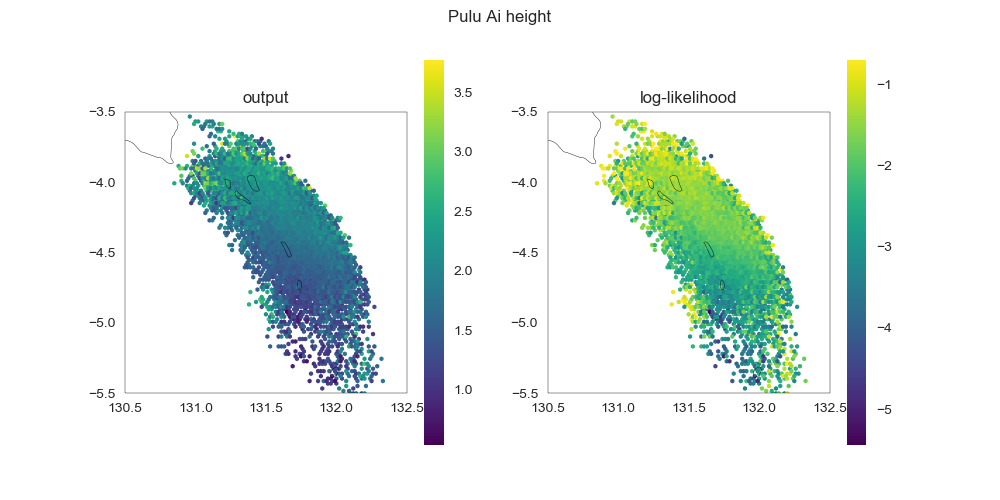

<IPython.core.display.Javascript object>


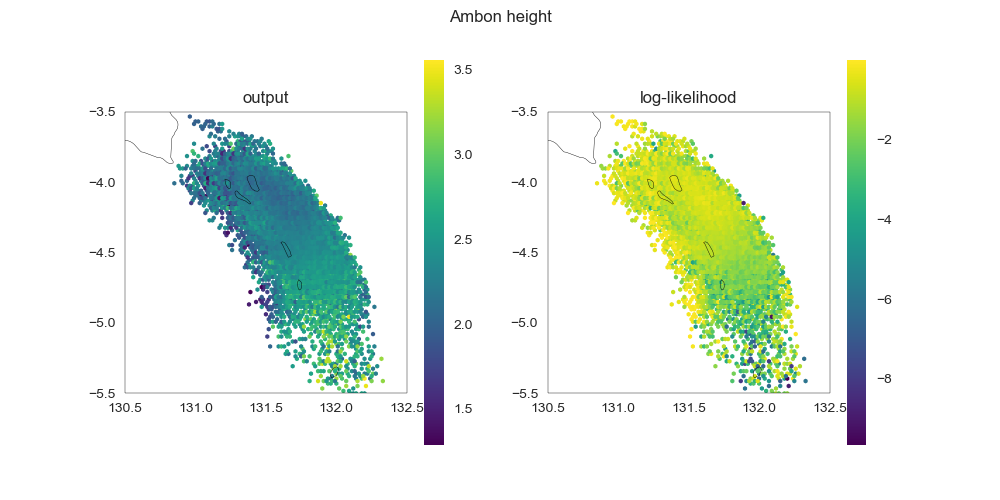

<IPython.core.display.Javascript object>


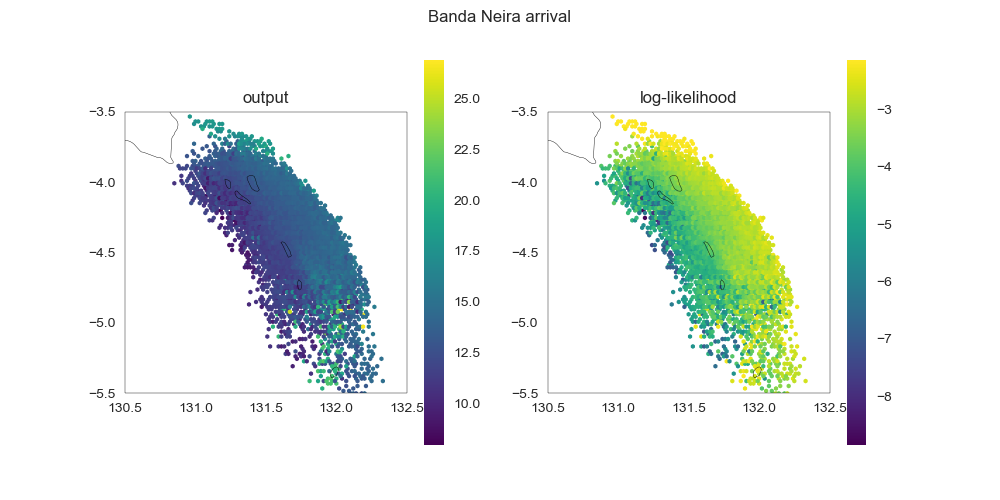

<IPython.core.display.Javascript object>


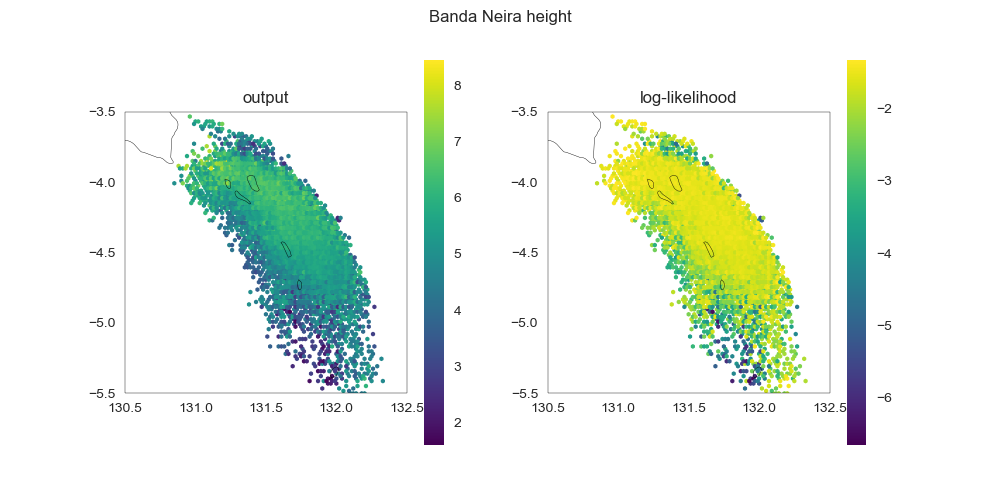

<IPython.core.display.Javascript object>


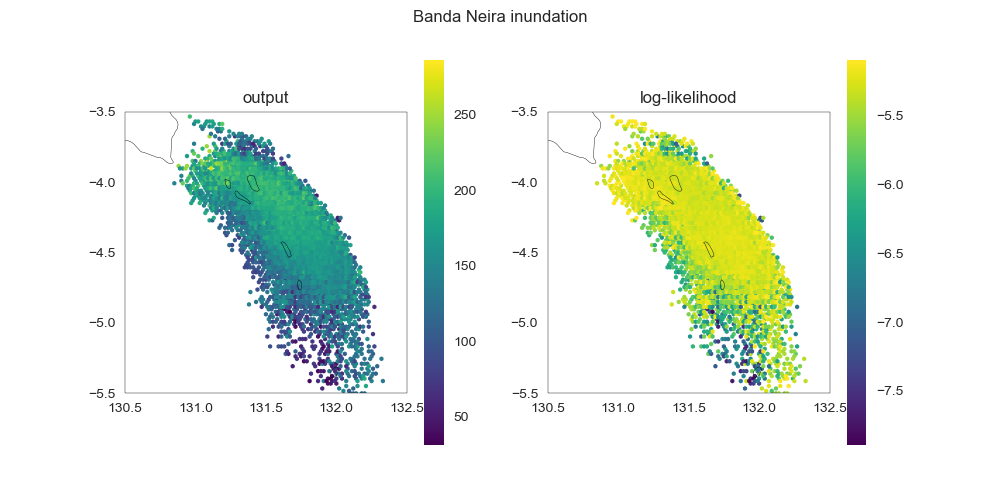

<IPython.core.display.Javascript object>


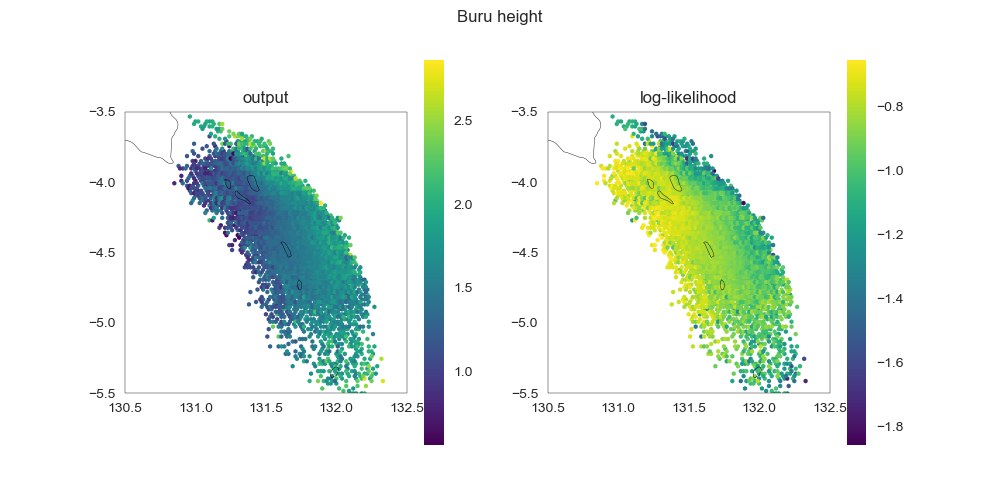

<IPython.core.display.Javascript object>


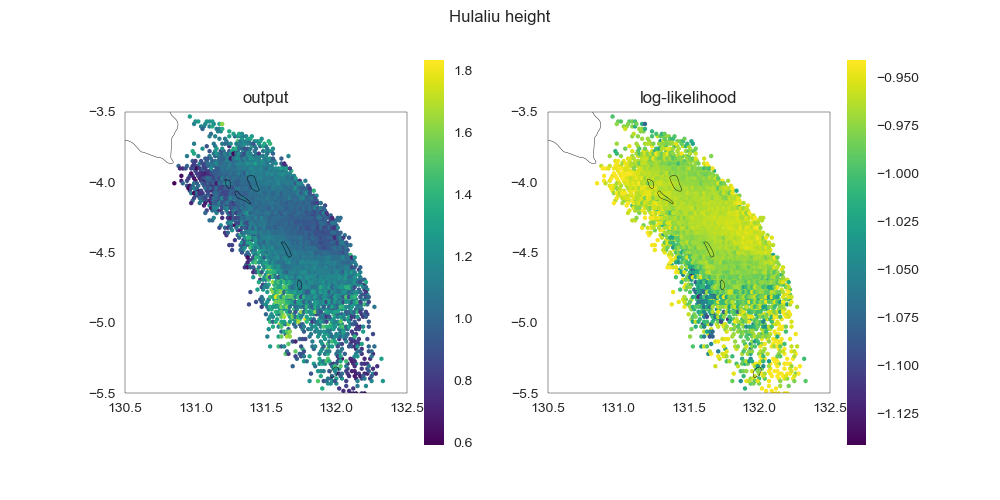

<IPython.core.display.Javascript object>


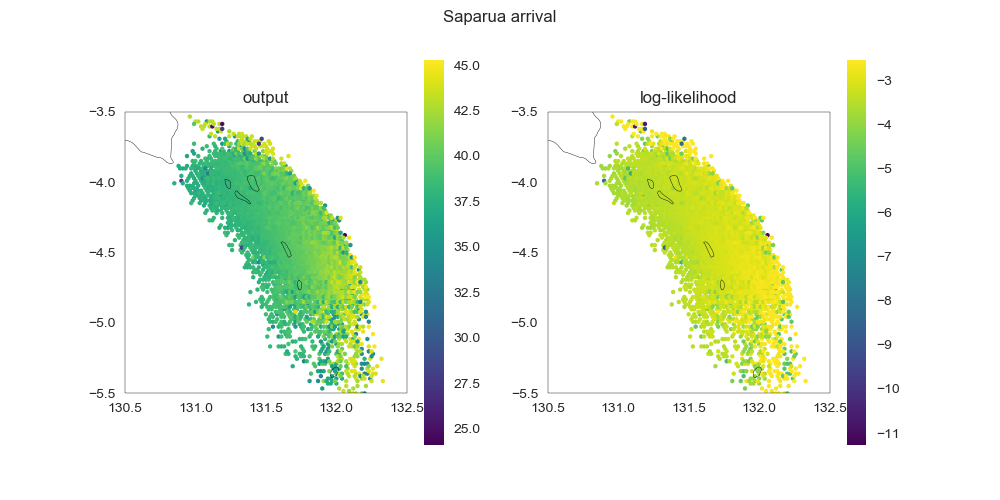

<IPython.core.display.Javascript object>


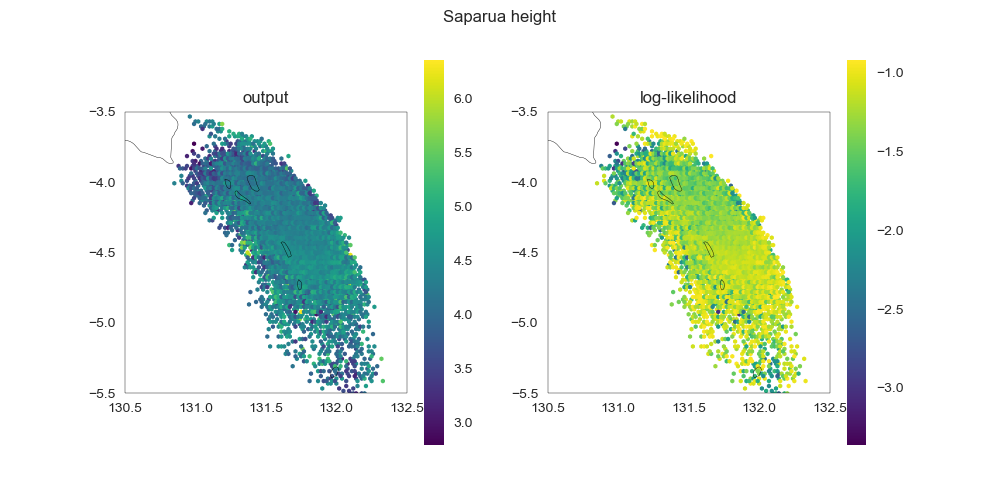

<IPython.core.display.Javascript object>


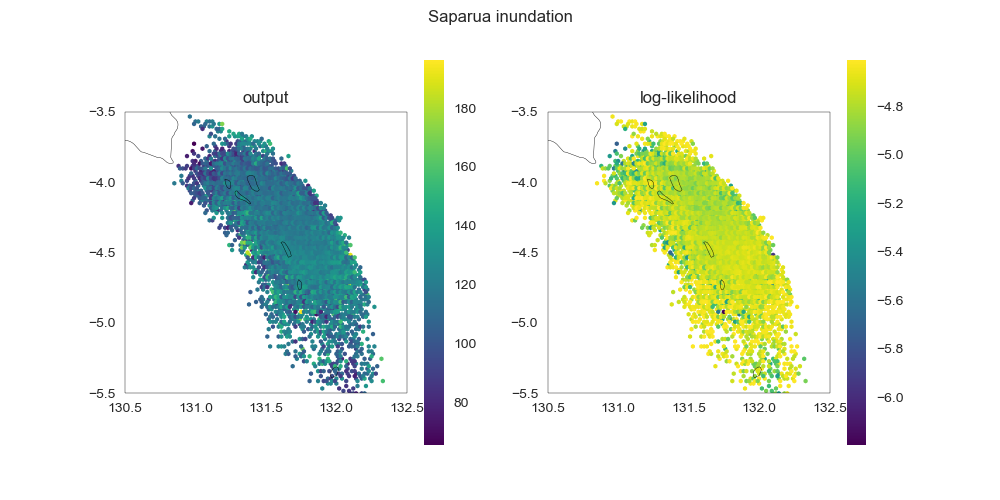

<IPython.core.display.Javascript object>


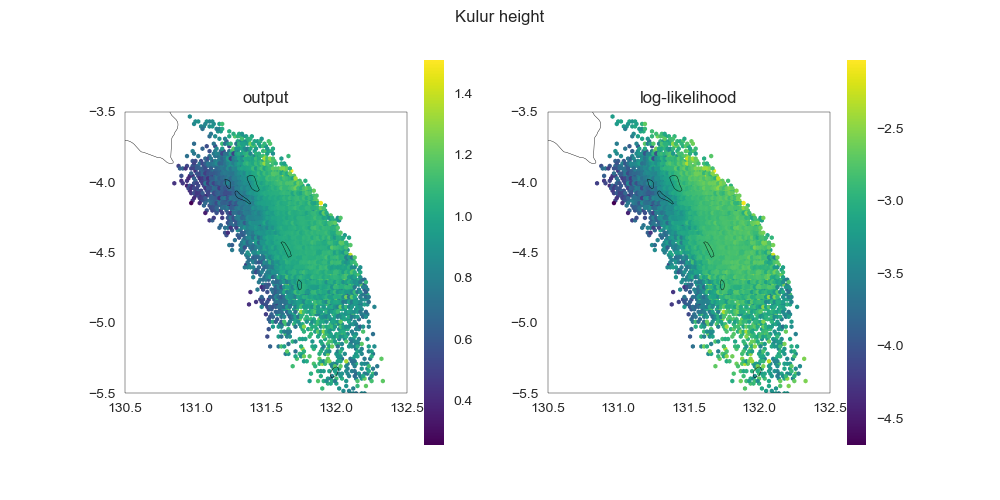

<IPython.core.display.Javascript object>


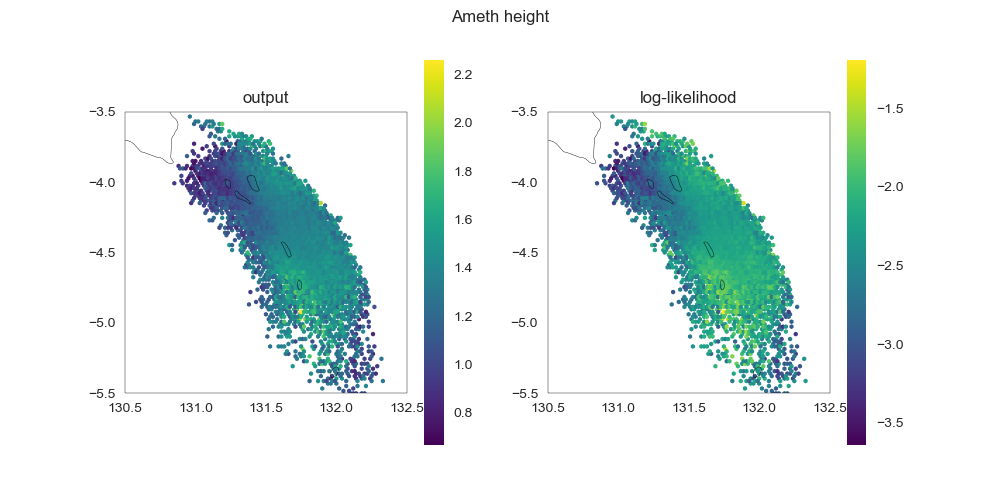

<IPython.core.display.Javascript object>


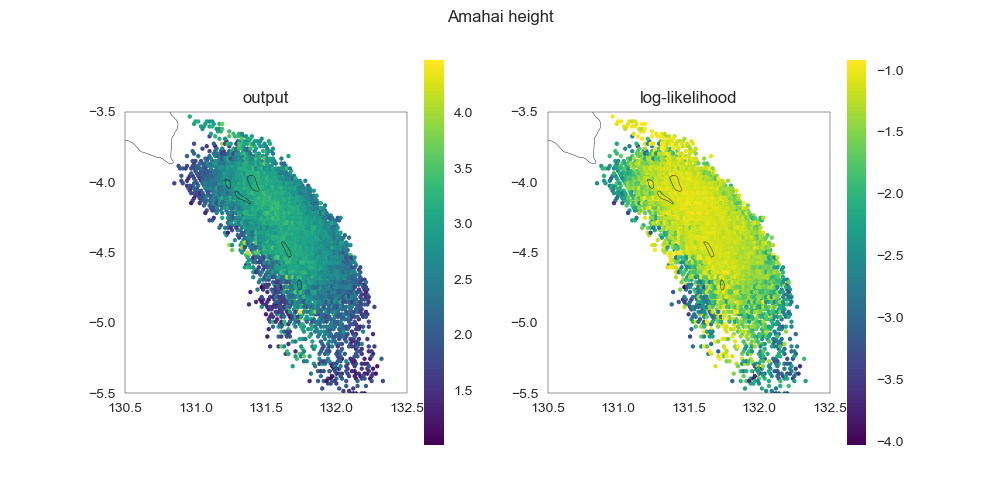

In [21]:
crs = ccrs.PlateCarree()
for gauge in gauges:
    for obstype in gauge.obstypes:
        key = gauge.name+' '+obstype
        fig = plt.figure(figsize=(10,5))
        ax = plt.subplot(1,2,1,projection=crs)
        ax.set_extent((130.5,132.5,-5.5,-3.5))
        ax.coastlines(resolution='10m')
        plt.xticks([130.5,131,131.5,132,132.5])
        plt.yticks([-5.5,-5,-4.5,-4,-3.5])
        plt.hexbin(comb_samples['longitude'],comb_samples['latitude'],
                   C=comb_model_output[key],
                   cmap='viridis',
                   reduce_C_function=np.mean,
                   extent=(130.5,132.5,-5.5,-3.5))
        plt.colorbar()
        plt.title('output')
        ax = plt.subplot(1,2,2,projection=crs)
        ax.set_extent((130.5,132.5,-5.5,-3.5))
        ax.coastlines(resolution='10m')
        plt.xticks([130.5,131,131.5,132,132.5])
        plt.yticks([-5.5,-5,-4.5,-4,-3.5])
        plt.hexbin(comb_samples['longitude'],comb_samples['latitude'],
                   C=comb_llh[key],
                   cmap='viridis',
                   reduce_C_function=np.mean,
                   extent=(130.5,132.5,-5.5,-3.5))
        plt.colorbar()
        plt.title('log-likelihood')
        fig.suptitle(gauge.name+' '+obstype)
        plt.savefig(f'plots/{key}_cond.png')

In [15]:
def kde_cond(kde,x,y,z):
    X,Y,Z = np.meshgrid(x,y,z)
    pdf = kde.pdf(np.array([X.flatten(),Y.flatten(),Z.flatten()])).reshape(X.shape)
    return ((pdf*z).sum(axis=2))/pdf.sum(axis=2)

In [63]:
lat = np.linspace(-7,-3)
lon = np.linspace(130.5,132.5)
cond_output = dict()
cond_llh = dict()
for gauge in gauges:
    for obstype in gauge.obstypes:
        key = gauge.name+' '+obstype
        kde = gaussian_kde(np.vstack((comb_samples['latitude'],comb_samples['longitude'],comb_model_output[key])))
        C_linspace = np.linspace(comb_model_output[key].min(),comb_model_output[key].max())
        cond_output[key] = kde_cond(kde,lat,lon,C_linspace)
#         kde = gaussian_kde(np.vstack((comb_samples['latitude'],comb_samples['longitude'],comb_llh[key])))
#         C_linspace = np.linspace(comb_llh[key].min(),comb_llh[key].max())
#         cond_llh[key] = kde_cond(kde,lat,lon,C_linspace)

<IPython.core.display.Javascript object>


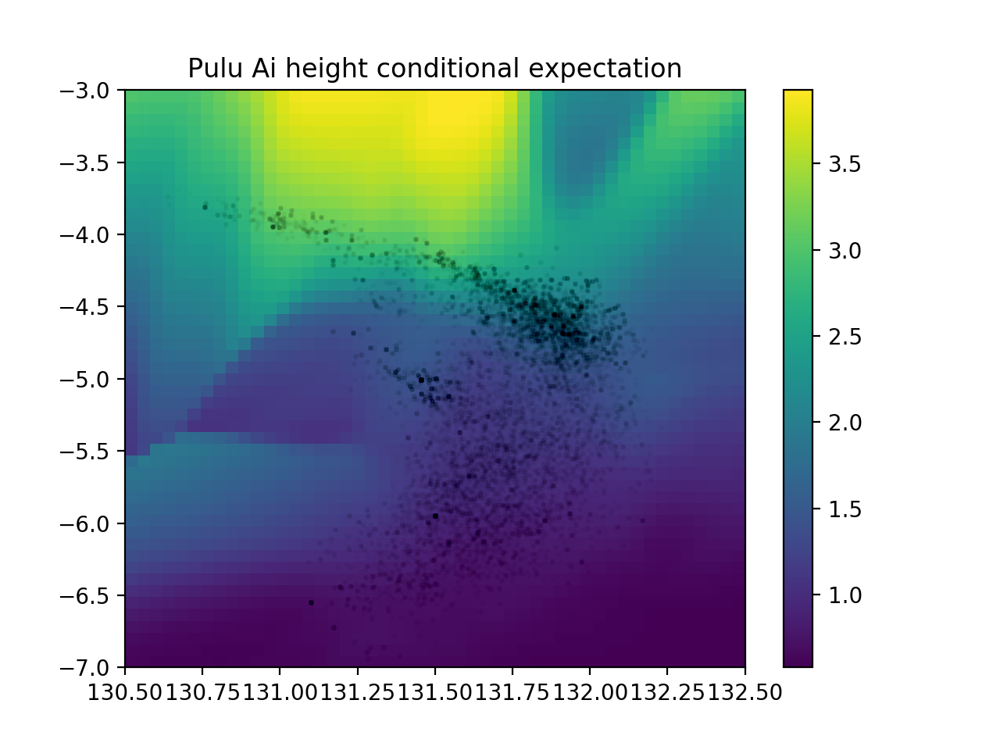

<IPython.core.display.Javascript object>


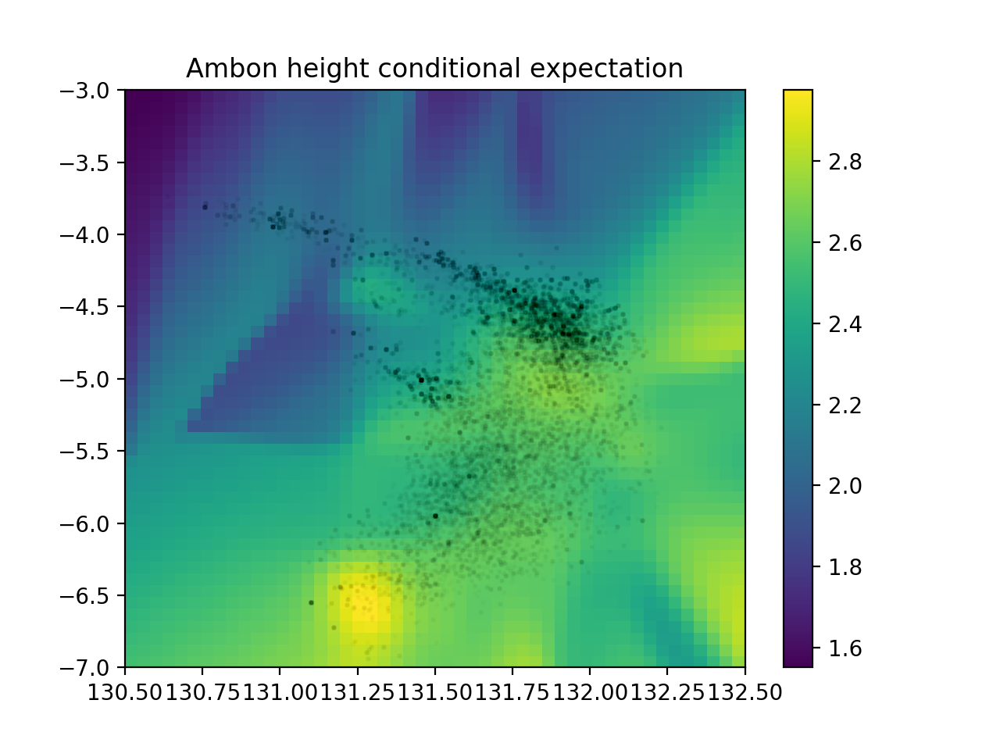

<IPython.core.display.Javascript object>


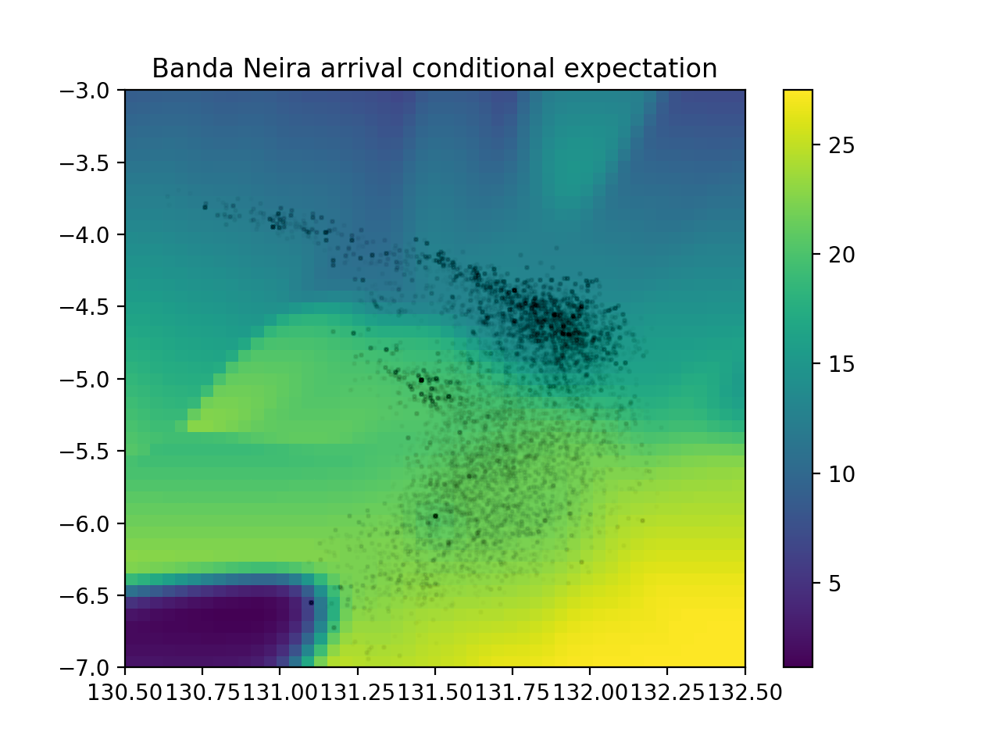

<IPython.core.display.Javascript object>


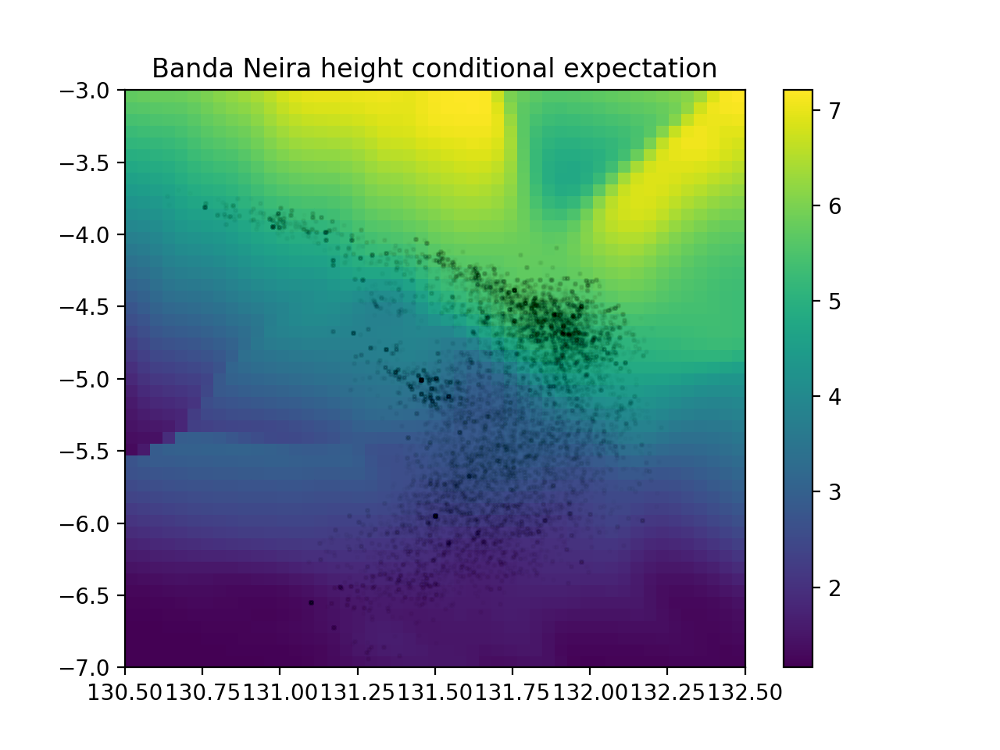

<IPython.core.display.Javascript object>


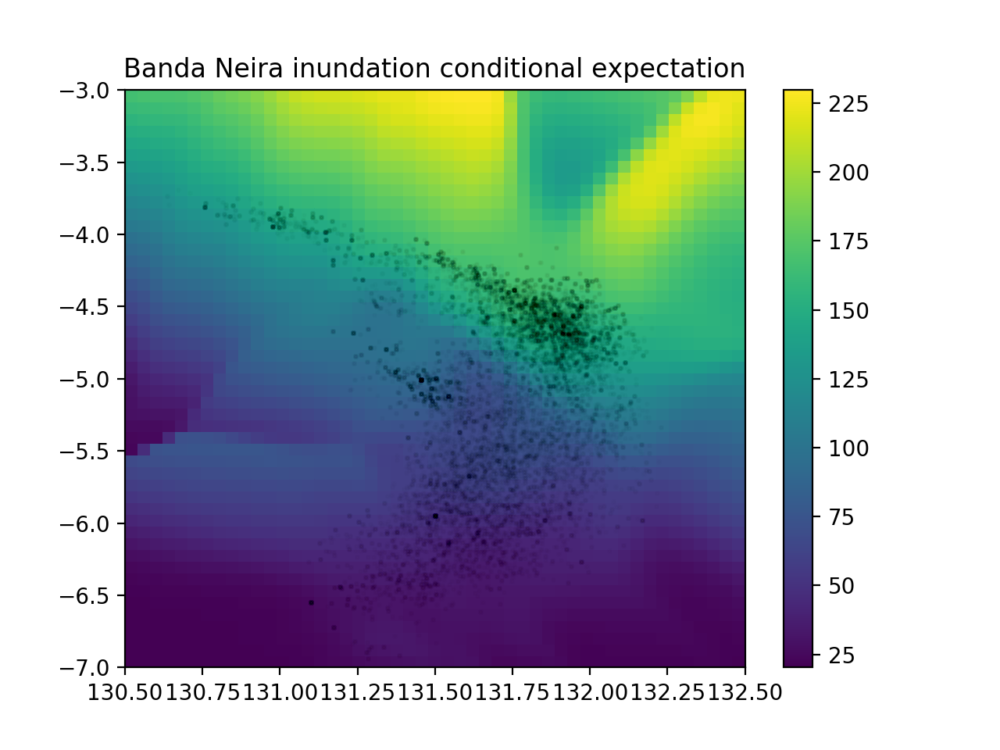

<IPython.core.display.Javascript object>


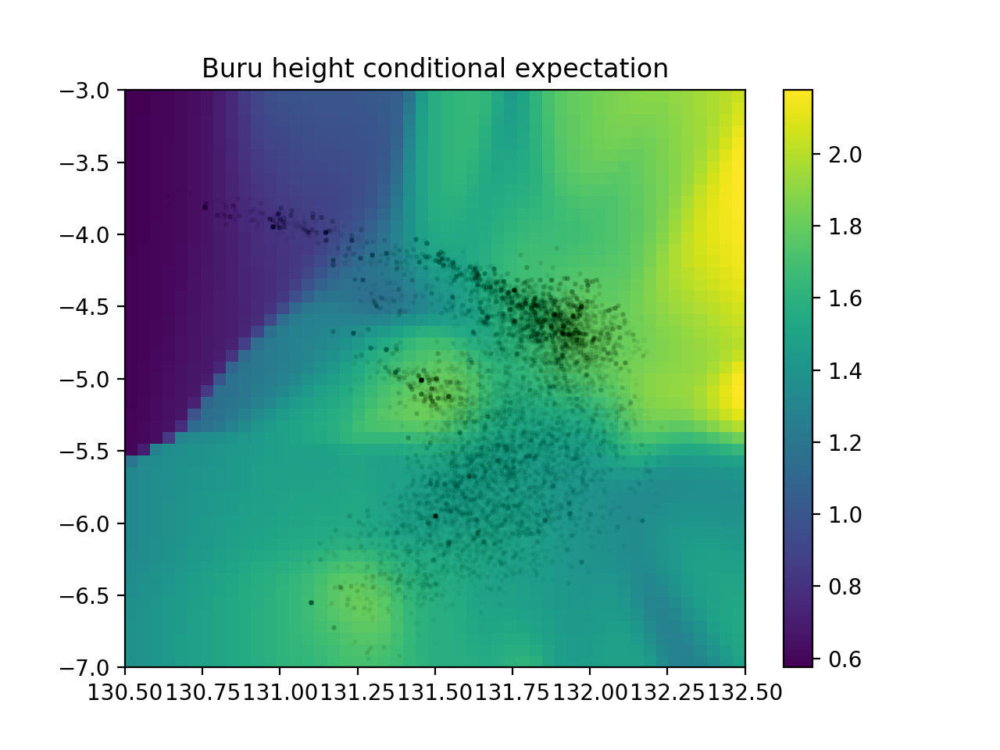

<IPython.core.display.Javascript object>


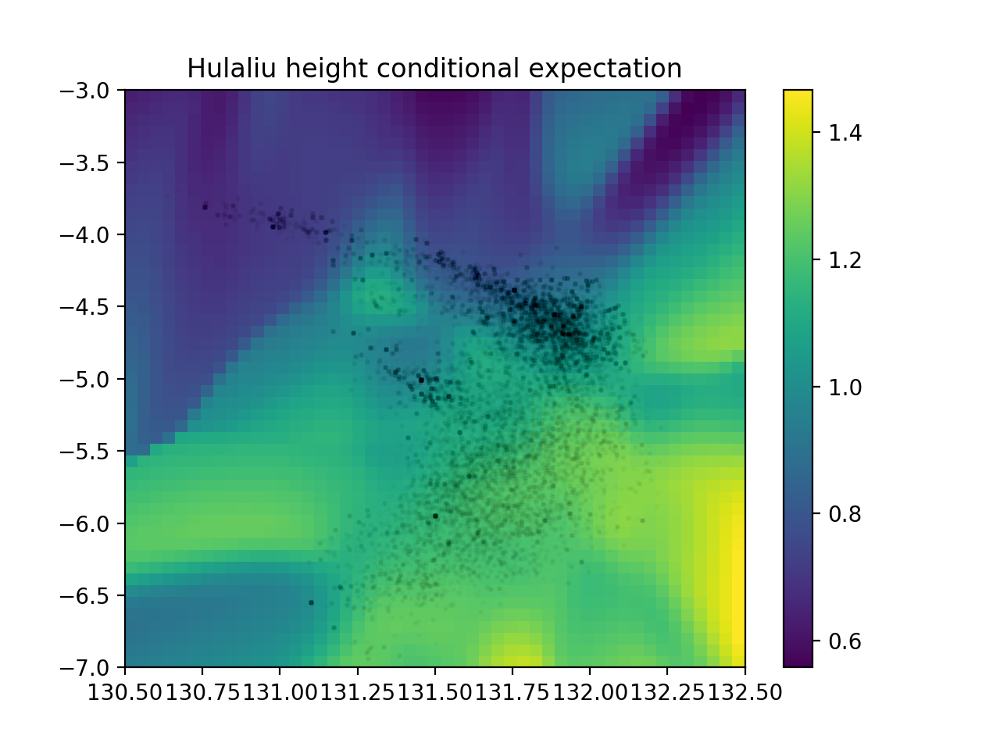

<IPython.core.display.Javascript object>


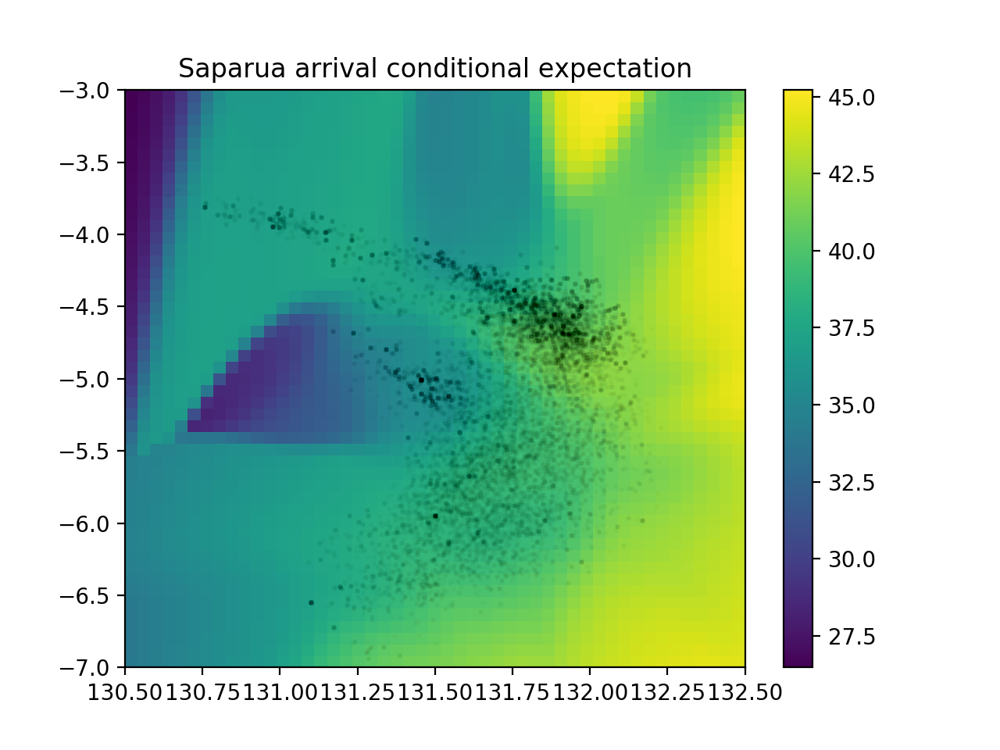

<IPython.core.display.Javascript object>


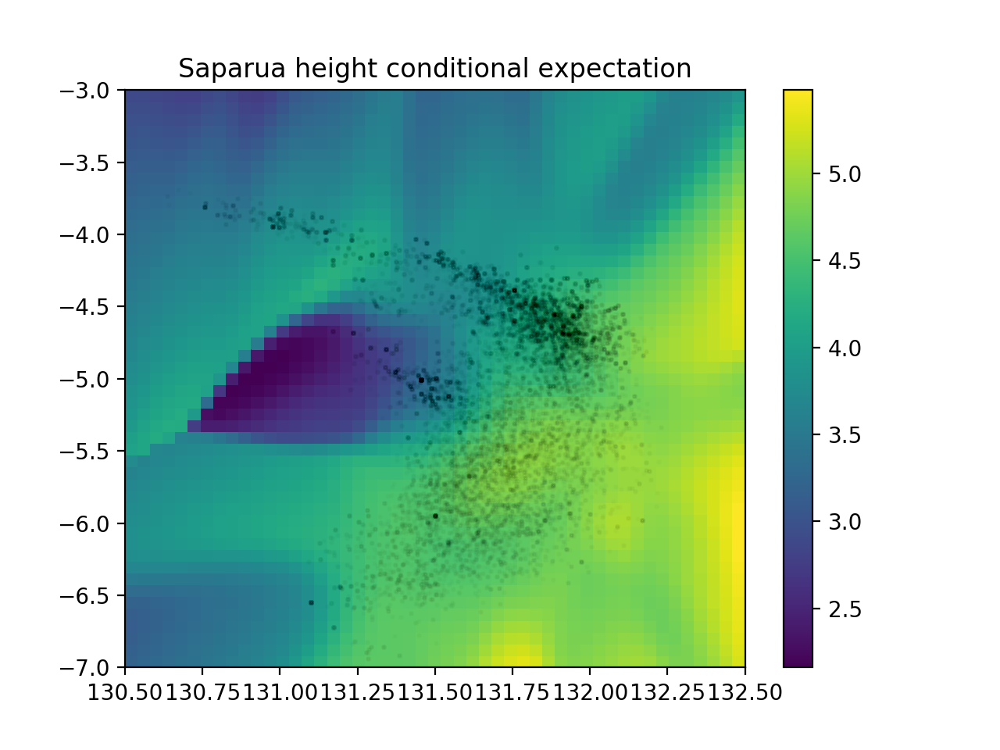

<IPython.core.display.Javascript object>


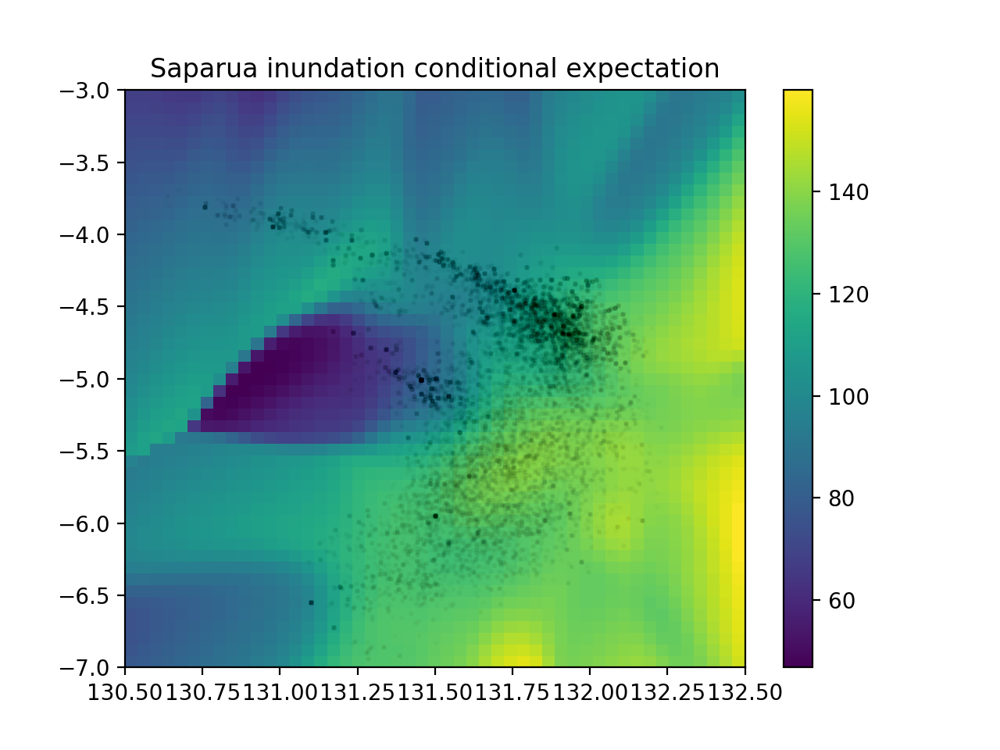

<IPython.core.display.Javascript object>


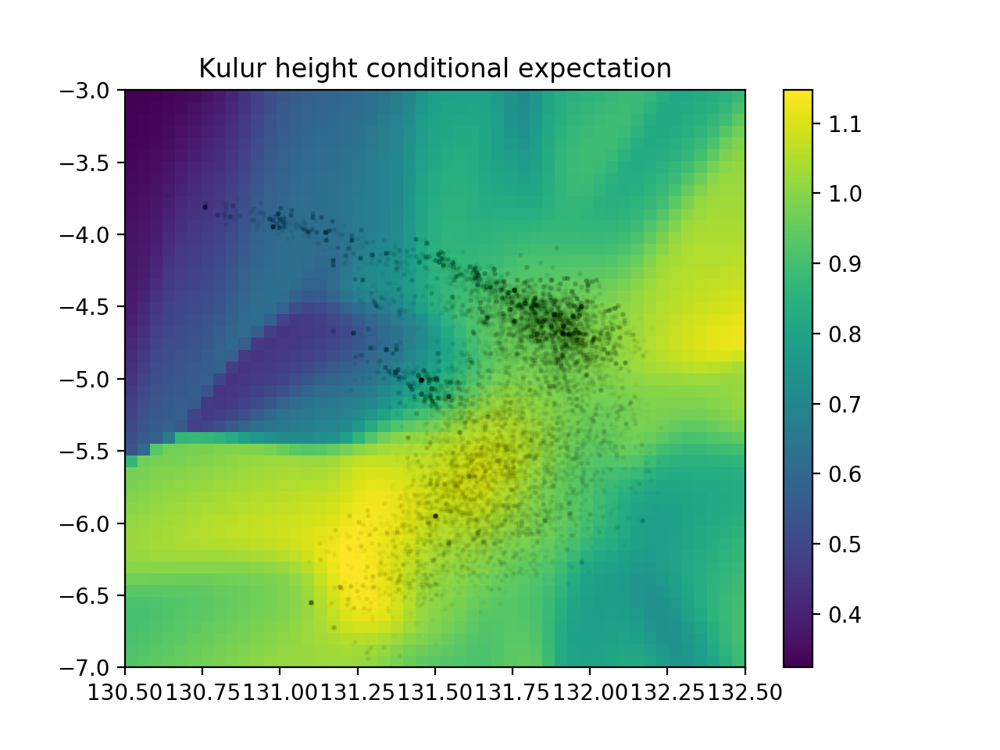

<IPython.core.display.Javascript object>


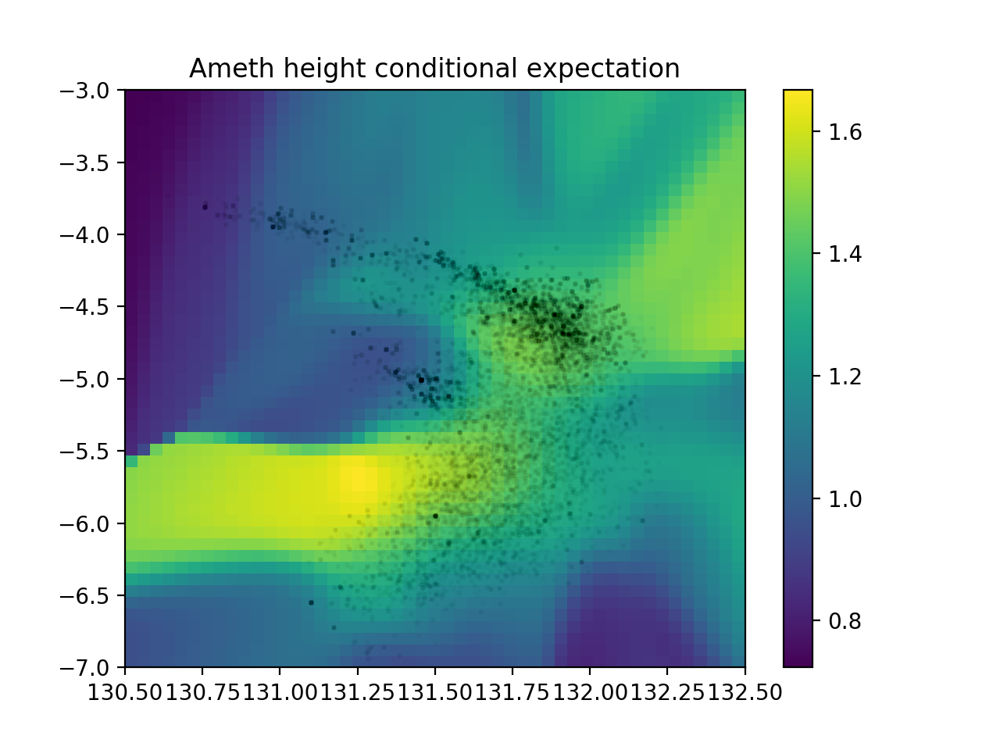

<IPython.core.display.Javascript object>


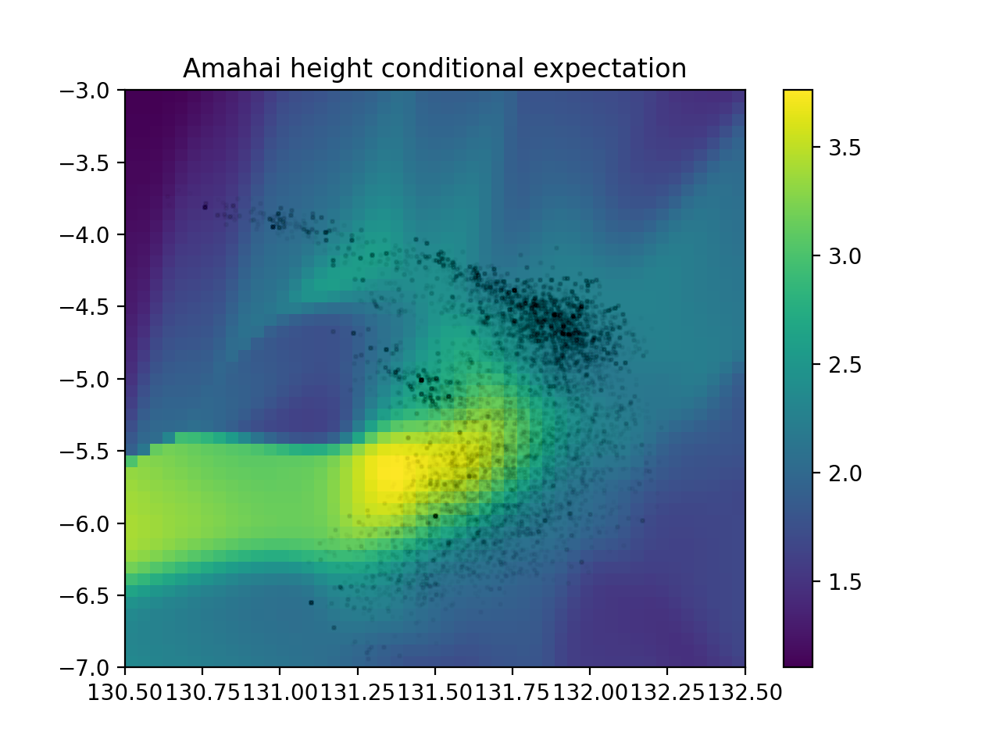

In [73]:
Lat,Lon = np.meshgrid(lat,lon)
for gauge in gauges:
    for obstype in gauge.obstypes:
        key = gauge.name+' '+obstype
        fig = plt.figure()
        
#         plt.subplot(1,2,1)
        plt.pcolormesh(Lon,Lat,cond_output[key])
        plt.colorbar()
        plt.scatter(comb_samples['longitude'],comb_samples['latitude'],c='k',s=2,alpha=.01)
#         plt.title('output')
        plt.title(gauge.name+' '+obstype+' conditional expectation')
        
#         plt.subplot(1,2,2)
#         plt.pcolormesh(Lon,Lat,cond_llh[key])
#         plt.colorbar()
#         plt.scatter(comb_samples['longitude'],comb_samples['latitude'],c='k',alpha=.01)
#         plt.title('log-likelihood')
#         fig.suptitle(gauge.name+' '+obstype+' conditional expectations')
        plt.show()

In [57]:
def latlondist(lat,lon,samples):
    return ((samples['latitude']-lat)**2+(samples['longitude']-lon)**2)
v_latlondist = np.vectorize(latlondist)

In [69]:
for key,val in cond_output.items():
    cond_output[key] = val[2]

In [13]:
tail_model_output = comb_model_output

In [20]:
bounds = {'Pulu Ai height':(0,6),
          'Ambon height':(0,4),
          'Banda Neira arrival':(0,30),
          'Banda Neira height':(0,11),
          'Banda Neira inundation':(0,360),
          'Buru height':(0,5),
          'Hulaliu height':(0,6),
          'Saparua arrival':(25,60),
          'Saparua height':(0,9),
          'Saparua inundation':(0,240),
          'Kulur height':(0,6),
          'Ameth height':(0,6),
          'Amahai height':(0,7)}

spots = {'Pulu Ai height':4,
          'Ambon height':14,
          'Banda Neira arrival':1,
          'Banda Neira height':2,
          'Banda Neira inundation':3,
          'Buru height':9,
          'Hulaliu height':11,
          'Saparua arrival':6,
          'Saparua height':7,
          'Saparua inundation':8,
          'Kulur height':12,
          'Ameth height':13,
          'Amahai height':10}

<IPython.core.display.Javascript object>


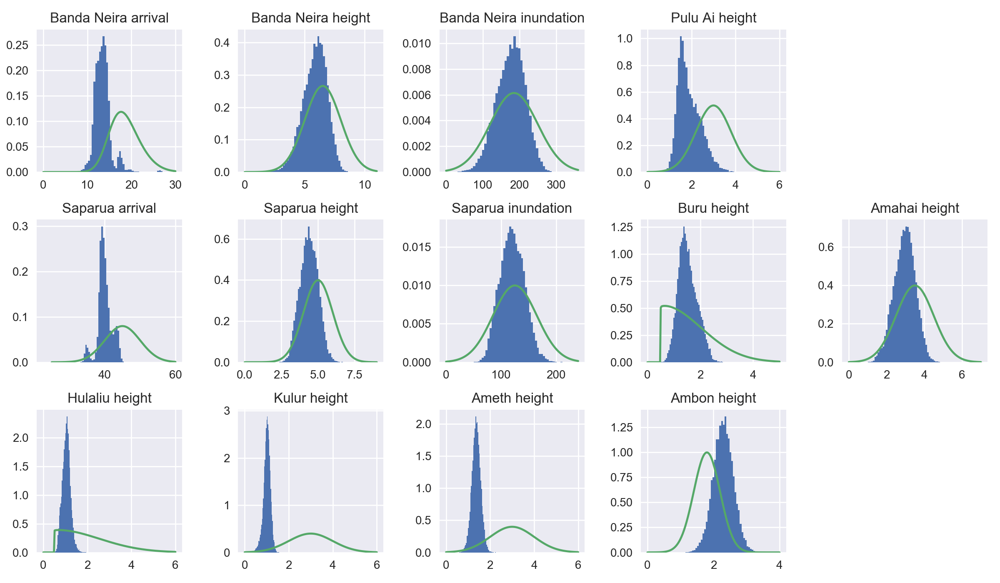

In [21]:
fig = plt.figure(figsize=(12,7))
for gauge in gauges:
    for obstype in gauge.obstypes:
        key = gauge.name+' '+obstype
        plt.subplot(3,5,spots[key])
        plt.hist(tail_model_output[key],bins=50,density=True)
        x = np.linspace(bounds[key][0],bounds[key][1],200)
        plt.plot(x,gauge.dists[obstype].pdf(x))
        plt.title(key)
plt.tight_layout()
plt.savefig('plots/obs_hists2.pdf')

<IPython.core.display.Javascript object>


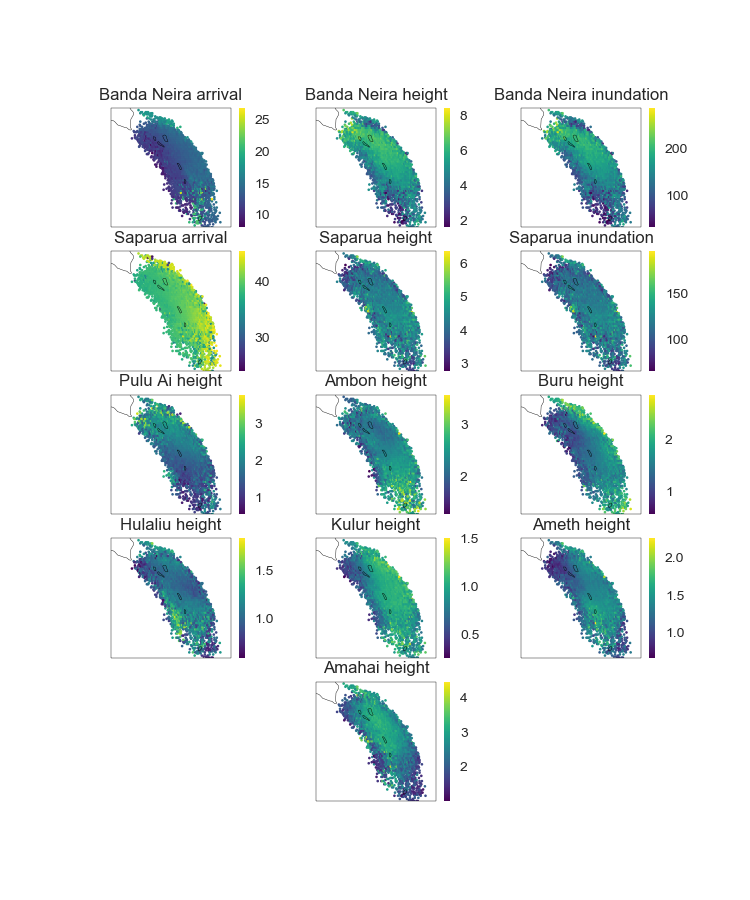

/Users/hringer/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


In [67]:
fig = plt.figure(figsize=(7.5,9))
for gauge in gauges:
    for obstype in gauge.obstypes:
        key = gauge.name+' '+obstype
        ax = plt.subplot(5,3,spots[key],projection=crs)
        ax.set_extent((130.5,132.5,-5.5,-3.5))
        ax.coastlines(resolution='10m')
        plt.hexbin(comb_samples['longitude'],comb_samples['latitude'],
                   C=comb_model_output[key],
                   cmap='viridis',
                   reduce_C_function=np.mean,
                   extent=(130.5,132.5,-5.5,-3.5))
        plt.colorbar()
        plt.title(gauge.name+' '+obstype)
plt.tight_layout()
plt.savefig('plots/obs_cond.pdf')
# plt.show()

<IPython.core.display.Javascript object>


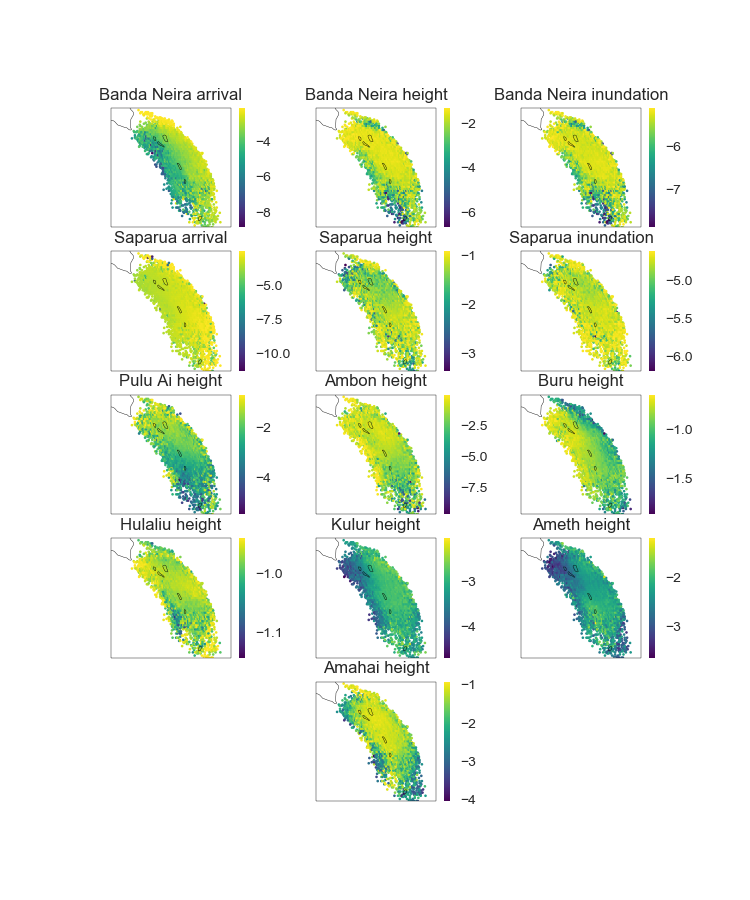

/Users/hringer/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  from ipykernel import kernelapp as app


In [68]:
fig = plt.figure(figsize=(7.5,9))
for gauge in gauges:
    for obstype in gauge.obstypes:
        key = gauge.name+' '+obstype
        ax = plt.subplot(5,3,spots[key],projection=crs)
        ax.set_extent((130.5,132.5,-5.5,-3.5))
        ax.coastlines(resolution='10m')
        plt.hexbin(comb_samples['longitude'],comb_samples['latitude'],
                   C=comb_llh[key],
                   cmap='viridis',
                   reduce_C_function=np.mean,
                   extent=(130.5,132.5,-5.5,-3.5))
        plt.colorbar()
        plt.title(gauge.name+' '+obstype)
plt.tight_layout()
plt.savefig('plots/obs_llh.png')

In [13]:
tail_llh = pd.concat([df.iloc[6000:] for df in llh],ignore_index=True)

In [26]:
tail_llh.max()

Pulu Ai height           -0.695795
Ambon height             -0.002648
Banda Neira arrival      -2.131836
Banda Neira height       -1.324404
Banda Neira inundation   -5.093326
Buru height              -0.653740
Hulaliu height           -0.940674
Saparua arrival          -2.528379
Saparua height           -0.918939
Saparua inundation       -4.607818
Kulur height             -2.070003
Ameth height             -1.316512
Amahai height            -0.918939
dtype: float64

In [29]:
tail_llh.loc[tail_llh['Ambon height'].idxmax()]

Pulu Ai height           -2.339241
Ambon height             -0.002648
Banda Neira arrival      -2.985310
Banda Neira height       -1.518747
Banda Neira inundation   -5.145999
Buru height              -0.731070
Hulaliu height           -0.963830
Saparua arrival          -3.065657
Saparua height           -0.930116
Saparua inundation       -4.651474
Kulur height             -3.050327
Ameth height             -2.745328
Amahai height            -1.289378
Name: 16953, dtype: float64

<IPython.core.display.Javascript object>


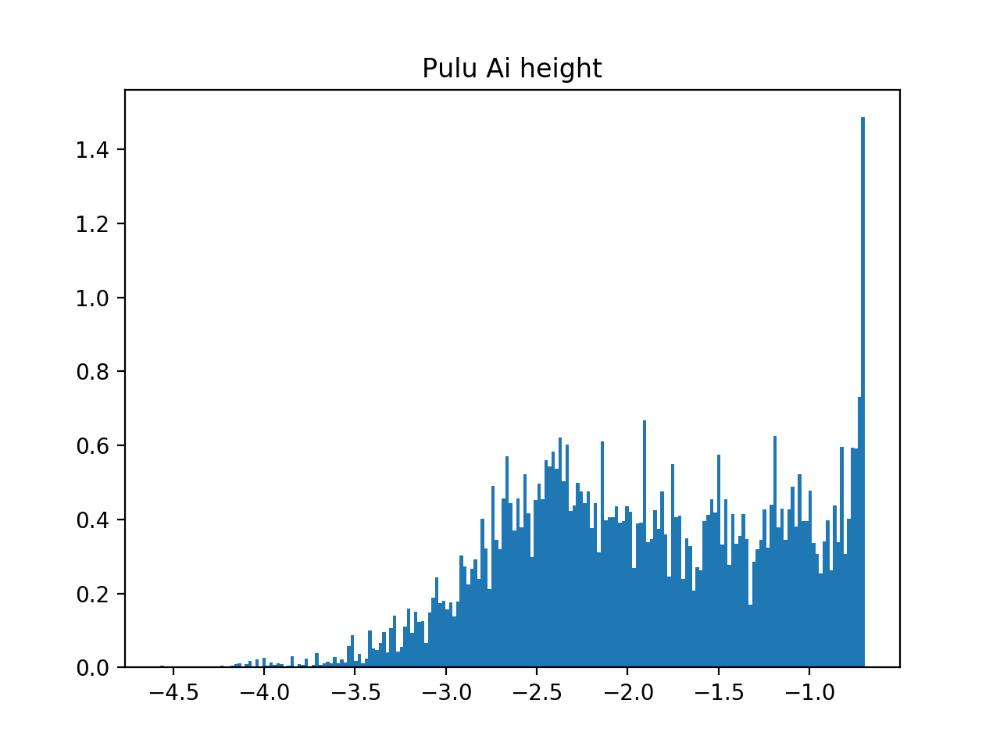

<IPython.core.display.Javascript object>


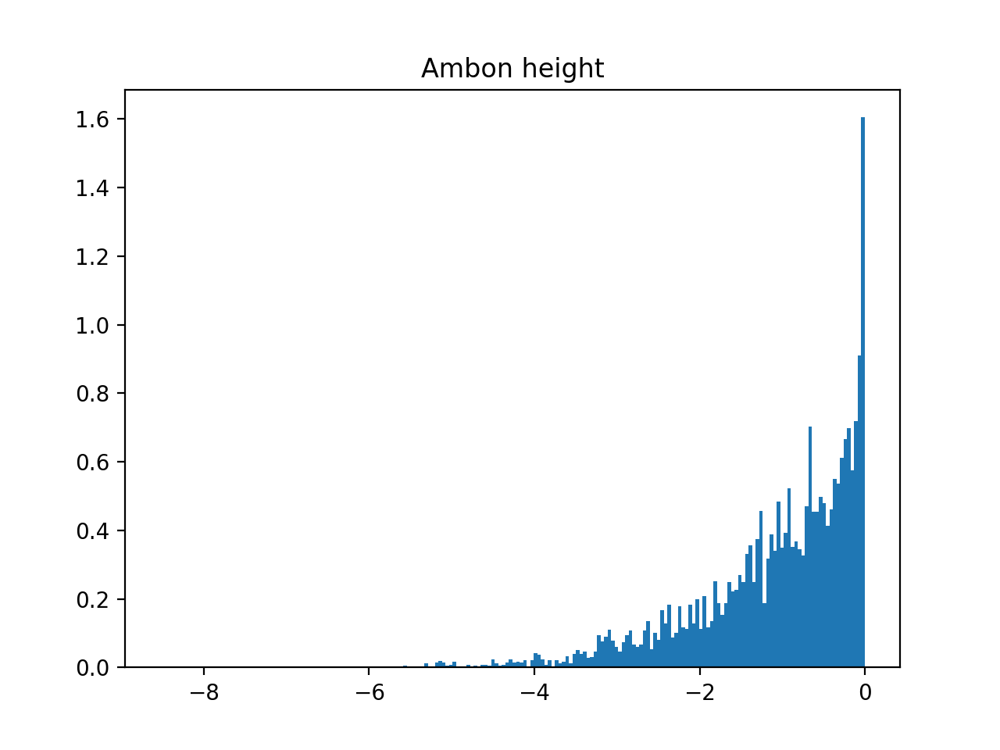

<IPython.core.display.Javascript object>


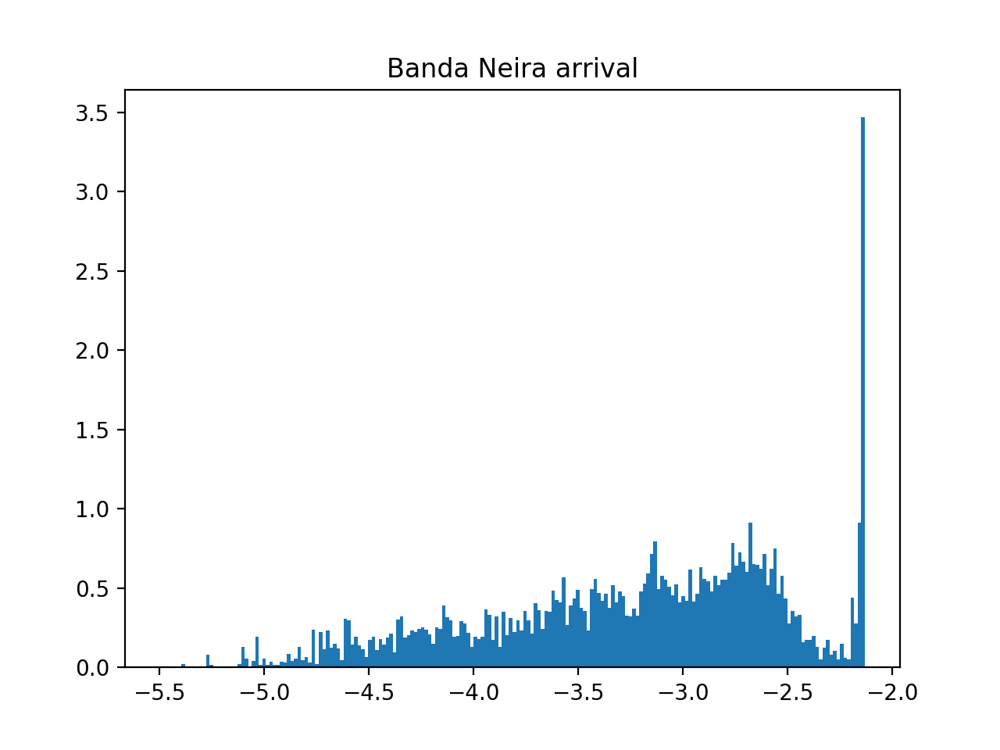

<IPython.core.display.Javascript object>


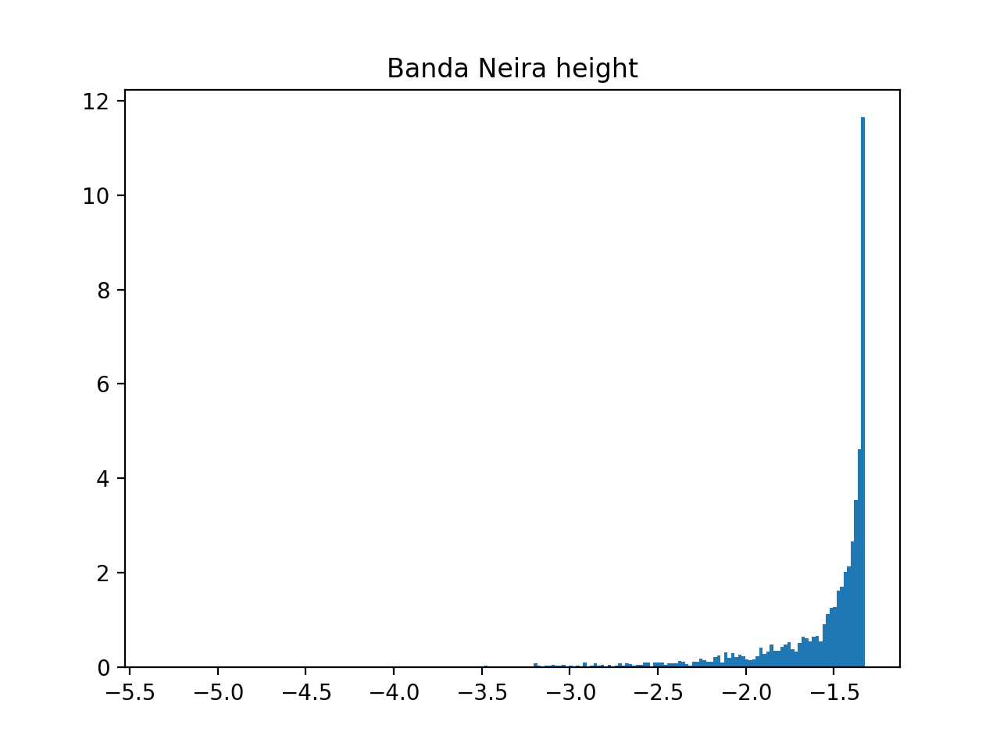

<IPython.core.display.Javascript object>


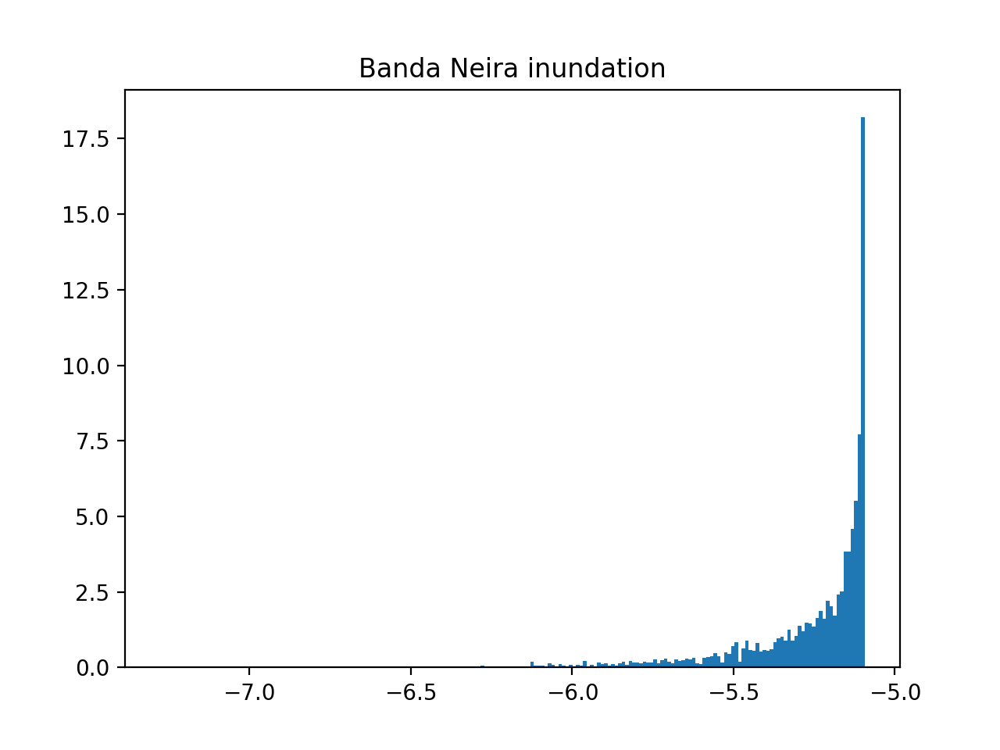

<IPython.core.display.Javascript object>


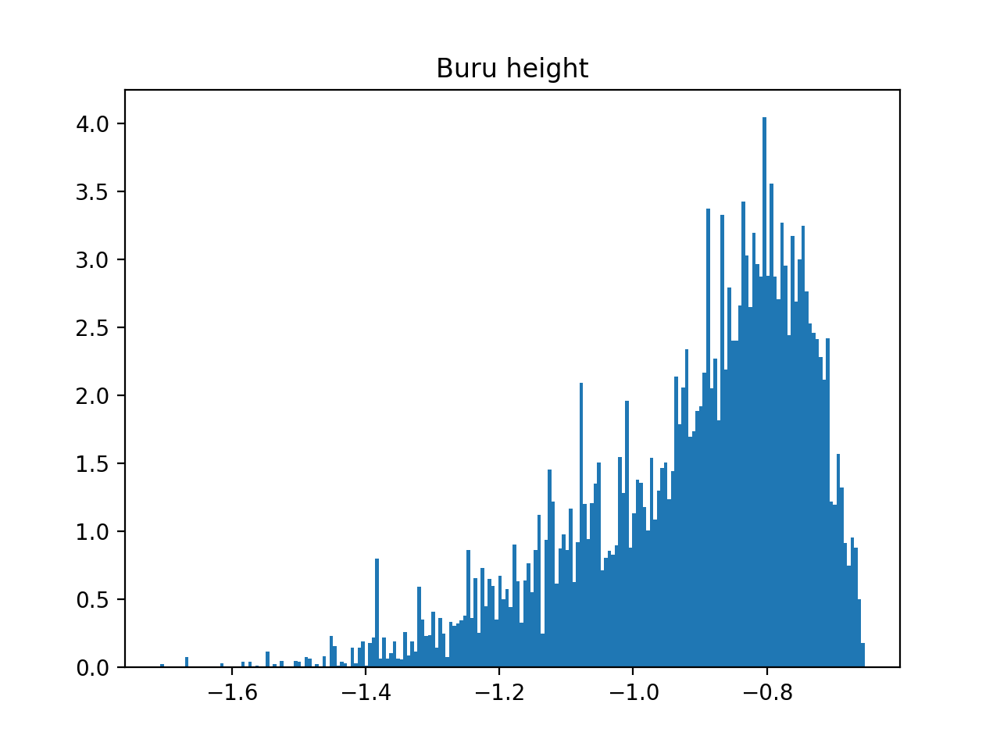

<IPython.core.display.Javascript object>


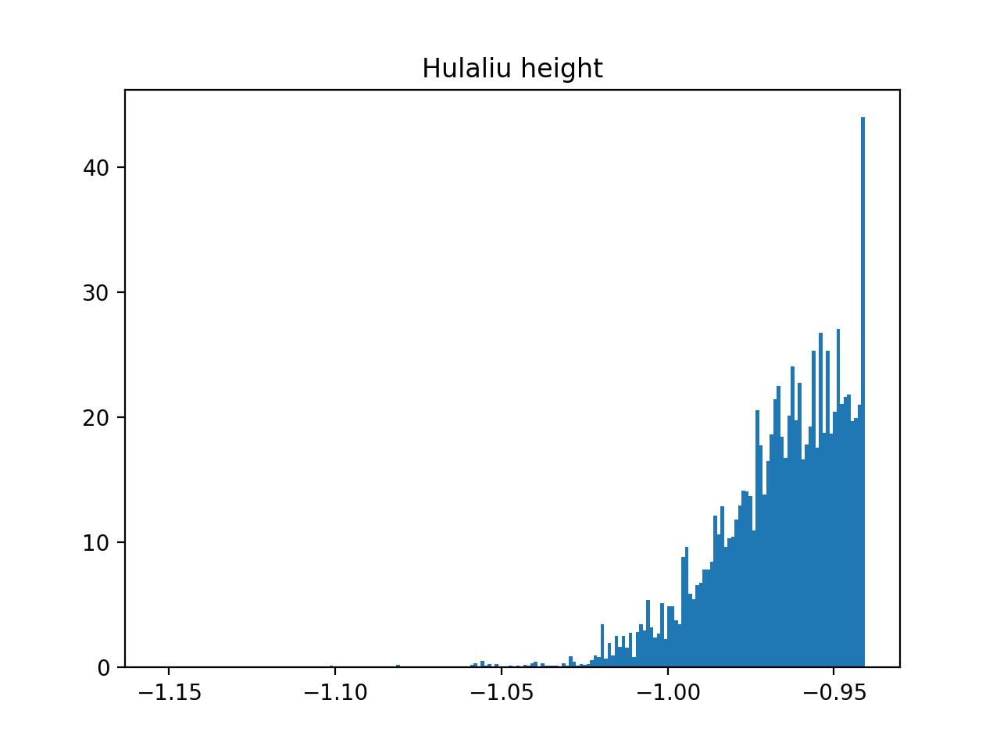

/Users/hringer/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


<IPython.core.display.Javascript object>


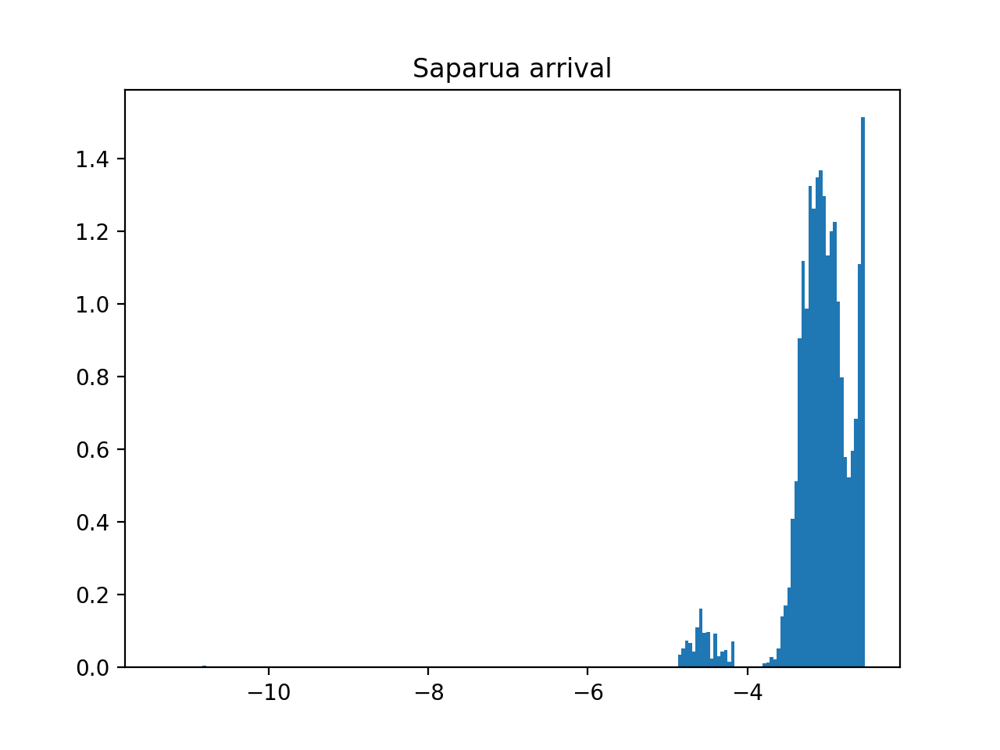

<IPython.core.display.Javascript object>


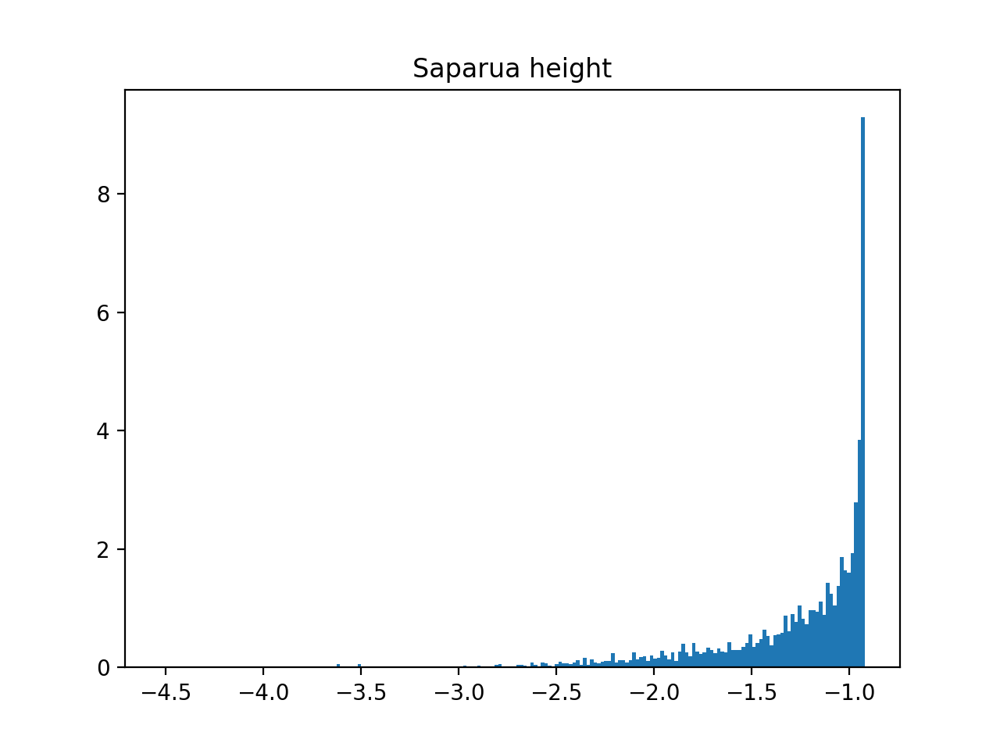

<IPython.core.display.Javascript object>


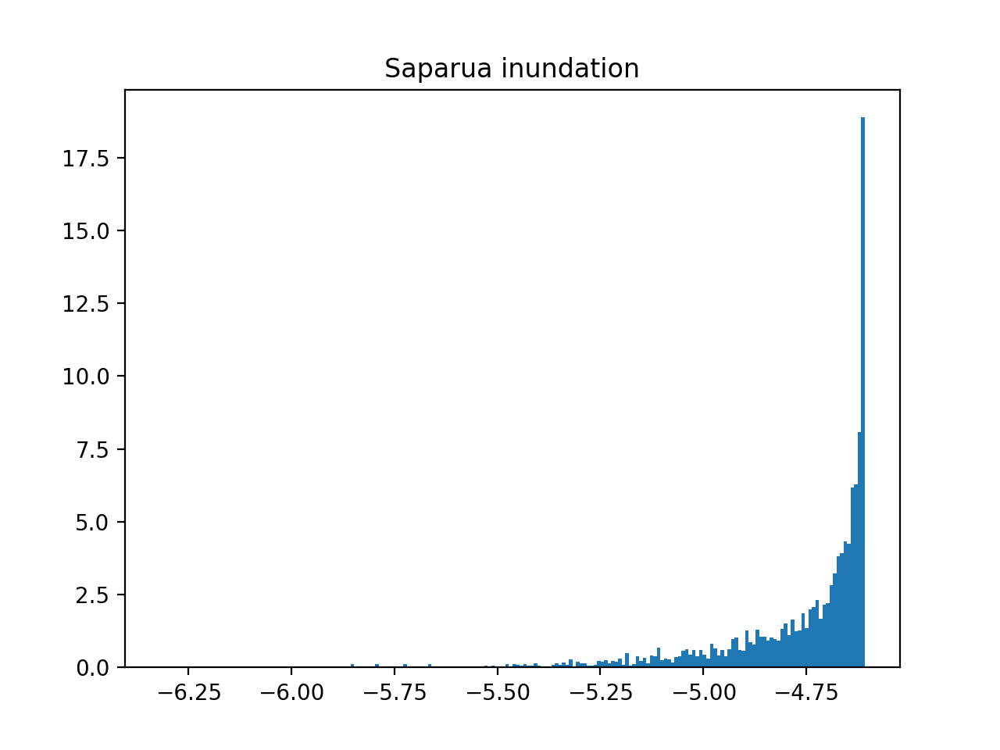

<IPython.core.display.Javascript object>


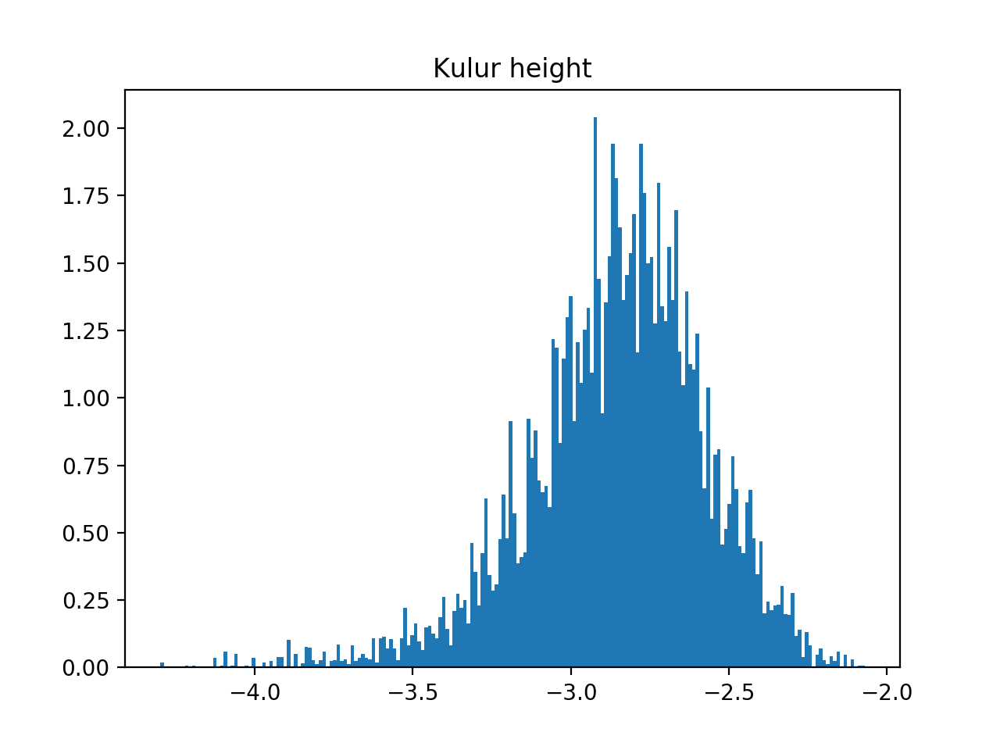

<IPython.core.display.Javascript object>


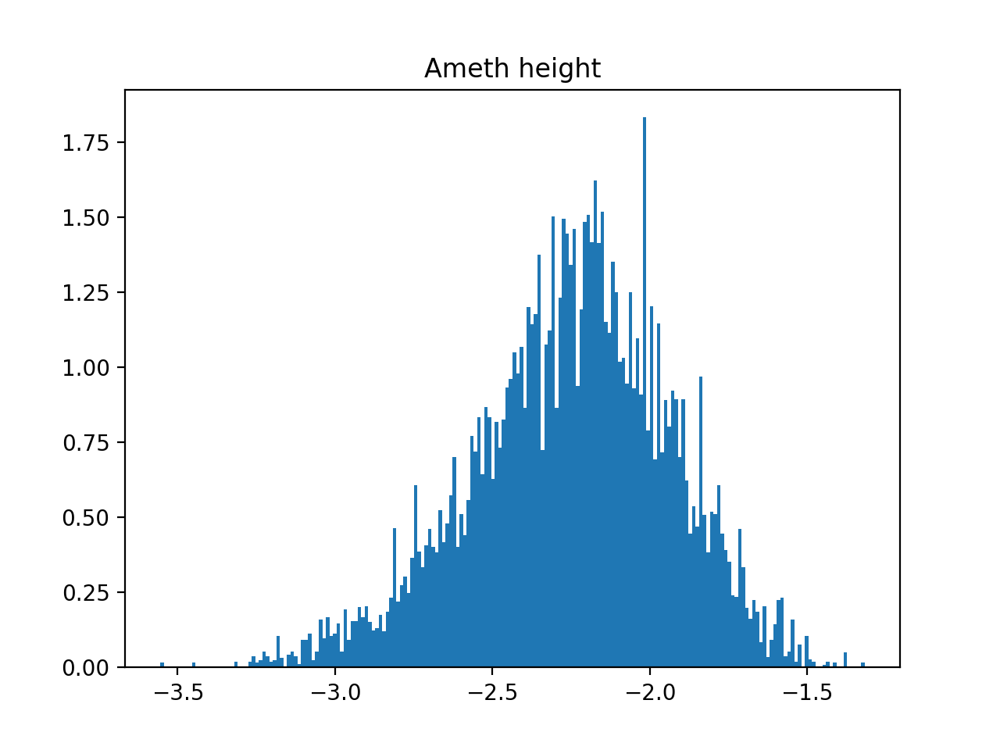

<IPython.core.display.Javascript object>


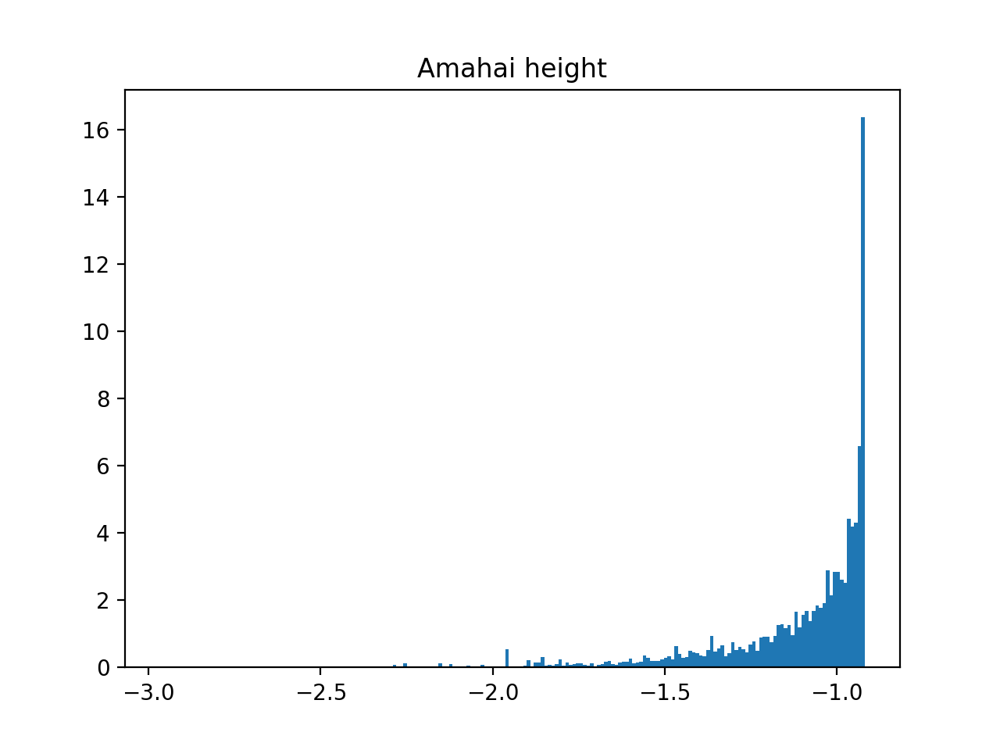

In [25]:
for gauge in gauges:
    for obstype in gauge.obstypes:
        key = gauge.name+' '+obstype
        fig = plt.figure()
        plt.hist(tail_llh[key],bins=200,density=True)
#         x = np.linspace(tail_model_output[key].min(),tail_model_output[key].max(),100)
#         plt.plot(x,gauge.dists[obstype].pdf(x))
        plt.title(key)
        plt.show()

In [ ]:
cov = np.cov(np.array(tail_llh))